## Thickness Maps

- Load the data from HDF5 for retinal layer annotations 
- Load the detections from the detection dataset
- Compute ILM to BM thickness and create thickness map

##                                                                                    
- With the detection 
- 

In [2]:
# Import required libraries
import h5py
import pickle
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from collections import defaultdict
import re

In [3]:
# Paths
data_path = '/home/suraj/Data/Nemours/Nemours_Jing_0929.h5'
detection_path = '/home/suraj/Git/RCNN-OCT/nemours_inference/full_dataset_inference.pkl'

In [4]:
# Load HDF5 annotations data
print("Loading HDF5 annotations data...")
with h5py.File(data_path, 'r') as f:
    print("\nHDF5 Keys:", list(f.keys()))
    
    # Load images and names
    images = f['images'][:]
    names = f['names'][:]
    bscan_indices = f['bscan_indices'][:]
    
    # Decode names if they're bytes
    if isinstance(names[0], bytes):
        names = [name.decode('utf-8') for name in names]
    
    # Load layer annotations (ILM and BM)
    ilm_coords = f['layers/ILM'][:]
    bm_coords = f['layers/BM'][:]
    
    print(f"\nHDF5 Dataset shapes:")
    print(f"  Images: {images.shape}")
    print(f"  Names: {len(names)}")
    print(f"  B-scan indices: {bscan_indices.shape}")
    print(f"  ILM coords: {ilm_coords.shape}")
    print(f"  BM coords: {bm_coords.shape}")

# Get unique volume names
unique_volumes = []
seen_volumes = set()
for name in names:
    if name not in seen_volumes:
        unique_volumes.append(name)
        seen_volumes.add(name)
        if len(unique_volumes) >= 10:
            break

print(f"\nFirst 10 unique volume names from HDF5:")
for i, vol_name in enumerate(unique_volumes):
    print(f"  {i+1}: {vol_name}")

Loading HDF5 annotations data...

HDF5 Keys: ['bscan_indices', 'images', 'layers', 'names']

HDF5 Dataset shapes:
  Images: (2540, 496, 768)
  Names: 2540
  B-scan indices: (2540,)
  ILM coords: (2540, 768)
  BM coords: (2540, 768)

First 10 unique volume names from HDF5:
  1: 256_L_1_1.e2e
  2: 256_L_1_3.e2e
  3: 256_L_1_4.e2e
  4: 142_R_3.e2e
  5: 62_R_6.e2e
  6: 242_L_1.e2e
  7: 25_R_3.e2e
  8: 247_L_1_1.e2e
  9: 247_L_1_2.e2e
  10: 62_L_6.e2e


In [5]:
# Load inference detections
print("\nLoading inference detections...")
with open(detection_path, 'rb') as f:
    detection_data = pickle.load(f)

print(f"\nDetection data type: {type(detection_data)}")
print(f"Number of volumes in detection data: {len(detection_data)}")

print(f"\nFirst 10 volume IDs from detection data:")
for i, vol_id in enumerate(list(detection_data.keys())[:10]):
    num_bscans = len(detection_data[vol_id])
    print(f"  {i}: {vol_id} (B-scans: {num_bscans})")
    
# Show sample detection structure
sample_vol = list(detection_data.keys())[0]
sample_bscan = detection_data[sample_vol][0]
print(f"\nSample detection keys: {sample_bscan.keys()}")


Loading inference detections...

Detection data type: <class 'dict'>
Number of volumes in detection data: 104

First 10 volume IDs from detection data:
  0: 256_L_1_1 (B-scans: 28)
  1: 256_L_1_3 (B-scans: 5)
  2: 256_L_1_4 (B-scans: 5)
  3: 142_R_3 (B-scans: 31)
  4: 62_R_6 (B-scans: 31)
  5: 242_L_1 (B-scans: 31)
  6: 25_R_3 (B-scans: 31)
  7: 247_L_1_1 (B-scans: 31)
  8: 247_L_1_2 (B-scans: 5)
  9: 62_L_6 (B-scans: 31)

Sample detection keys: dict_keys(['image', 'pred_boxes', 'pred_scores', 'pred_labels', 'bscan_idx', 'global_idx', 'volume_id'])


In [6]:
# Create mapping from HDF5 data using the bscan_indices field
hdf5_mapping = {}
for idx, (name, bscan_idx) in enumerate(zip(names, bscan_indices)):
    # Remove .e2e extension to get volume ID
    vol_id = name.replace('.e2e', '')
    
    # Create unique key: volume_id + bscan_idx
    key = f"{vol_id}_{bscan_idx:03d}"
    hdf5_mapping[key] = {
        'global_idx': idx,
        'volume_id': vol_id,
        'bscan_idx': bscan_idx,
        'original_name': name
    }

print(f"\nHDF5 mapping created: {len(hdf5_mapping)} entries")
print("\nSample HDF5 mappings:")
for i, (key, value) in enumerate(list(hdf5_mapping.items())[:10]):
    print(f"  {key}: vol={value['volume_id']}, bscan={value['bscan_idx']}, idx={value['global_idx']}")


HDF5 mapping created: 2540 entries

Sample HDF5 mappings:
  256_L_1_1_000: vol=256_L_1_1, bscan=0, idx=0
  256_L_1_1_001: vol=256_L_1_1, bscan=1, idx=1
  256_L_1_1_002: vol=256_L_1_1, bscan=2, idx=2
  256_L_1_1_003: vol=256_L_1_1, bscan=3, idx=3
  256_L_1_1_004: vol=256_L_1_1, bscan=4, idx=4
  256_L_1_1_005: vol=256_L_1_1, bscan=5, idx=5
  256_L_1_1_006: vol=256_L_1_1, bscan=6, idx=6
  256_L_1_1_007: vol=256_L_1_1, bscan=7, idx=7
  256_L_1_1_008: vol=256_L_1_1, bscan=8, idx=8
  256_L_1_1_009: vol=256_L_1_1, bscan=9, idx=9


In [7]:
# Create mapping from detection data
detection_mapping = {}
for vol_id, bscans in detection_data.items():
    for bscan_data in bscans:
        bscan_idx = bscan_data['bscan_idx']
        key = f"{vol_id}_{bscan_idx:03d}"
        detection_mapping[key] = {
            'volume_id': vol_id,
            'bscan_idx': bscan_idx,
            'pred_boxes': bscan_data['pred_boxes'],
            'pred_labels': bscan_data['pred_labels'],
            'pred_scores': bscan_data['pred_scores'],
            'global_idx': bscan_data.get('global_idx', None)
        }

print(f"\nDetection mapping created: {len(detection_mapping)} entries")
print("\nSample detection mappings:")
for i, (key, value) in enumerate(list(detection_mapping.items())[:10]):
    num_boxes = len(value['pred_boxes'])
    print(f"  {key}: vol={value['volume_id']}, bscan={value['bscan_idx']}, boxes={num_boxes}")


Detection mapping created: 2540 entries

Sample detection mappings:
  256_L_1_1_000: vol=256_L_1_1, bscan=0, boxes=0
  256_L_1_1_001: vol=256_L_1_1, bscan=1, boxes=0
  256_L_1_1_002: vol=256_L_1_1, bscan=2, boxes=0
  256_L_1_1_003: vol=256_L_1_1, bscan=3, boxes=0
  256_L_1_1_004: vol=256_L_1_1, bscan=4, boxes=0
  256_L_1_1_005: vol=256_L_1_1, bscan=5, boxes=0
  256_L_1_1_006: vol=256_L_1_1, bscan=6, boxes=0
  256_L_1_1_007: vol=256_L_1_1, bscan=7, boxes=0
  256_L_1_1_008: vol=256_L_1_1, bscan=8, boxes=0
  256_L_1_1_009: vol=256_L_1_1, bscan=9, boxes=0


In [8]:
# Find matching B-scans between HDF5 and detection data
matching_keys = set(hdf5_mapping.keys()) & set(detection_mapping.keys())
print(f"\n{'='*60}")
print(f"MATCHING ANALYSIS")
print(f"{'='*60}")
print(f"Total HDF5 entries: {len(hdf5_mapping)}")
print(f"Total detection entries: {len(detection_mapping)}")
print(f"Matching B-scans: {len(matching_keys)}")

# Group by volumes
matching_volumes = defaultdict(list)
for key in matching_keys:
    vol_id = hdf5_mapping[key]['volume_id']
    bscan_idx = hdf5_mapping[key]['bscan_idx']
    matching_volumes[vol_id].append(bscan_idx)

# Sort volumes by number of matching B-scans
sorted_volumes = sorted(matching_volumes.items(), key=lambda x: len(x[1]), reverse=True)

print(f"\nCommon volumes found: {len(matching_volumes)}")
print(f"\n{'='*60}")
print(f"TOP 20 VOLUMES WITH MATCHING B-SCANS")
print(f"{'='*60}")
print(f"{'Volume ID':<30} {'B-scans':<10} {'Range'}")
print(f"{'-'*60}")

for vol_id, bscan_indices in sorted_volumes[:20]:
    bscan_indices_sorted = sorted(bscan_indices)
    min_idx = min(bscan_indices_sorted)
    max_idx = max(bscan_indices_sorted)
    print(f"{vol_id:<30} {len(bscan_indices):<10} {min_idx}-{max_idx}")


MATCHING ANALYSIS
Total HDF5 entries: 2540
Total detection entries: 2540
Matching B-scans: 2540

Common volumes found: 104

TOP 20 VOLUMES WITH MATCHING B-SCANS
Volume ID                      B-scans    Range
------------------------------------------------------------
97_L_6                         31         0-30
72_R_10                        31         0-30
259_R_1                        31         0-30
237_R_1                        31         0-30
242_R_1                        31         0-30
48_R_8                         31         0-30
152_L_3_1                      31         0-30
30_L_5                         31         0-30
250_R_1                        31         0-30
114_L_5                        31         0-30
241_L_1                        31         0-30
257_R_1_1                      31         0-30
124_L_5                        31         0-30
121_R_2                        31         0-30
248_R_1_1                      31         0-30
250_L_1                 

In [9]:
# Function to plot B-scans with layer annotations and bounding boxes
def plot_bscan_with_annotations_and_boxes(volume_id, bscan_indices=None, num_samples=3, 
                                          score_threshold=0.7, figsize=(15, 5)):
    """
    Plot B-scans with retinal layer annotations and bounding box detections.
    
    Parameters:
    -----------
    volume_id : str
        Volume identifier (e.g., '256_L_1_1')
    bscan_indices : list, optional
        Specific B-scan indices to plot. If None, randomly selects num_samples
    num_samples : int
        Number of B-scans to plot if bscan_indices not specified
    score_threshold : float
        Minimum confidence score for displaying bounding boxes
    figsize : tuple
        Figure size per subplot
    """
    
    # Get available B-scans for this volume
    if volume_id not in matching_volumes:
        print(f"Volume '{volume_id}' not found in matching volumes.")
        return
    
    available_bscans = sorted(matching_volumes[volume_id])
    
    if bscan_indices is None:
        # Randomly select B-scans
        num_samples = min(num_samples, len(available_bscans))
        bscan_indices = np.random.choice(available_bscans, num_samples, replace=False)
    else:
        bscan_indices = [idx for idx in bscan_indices if idx in available_bscans]
    
    if len(bscan_indices) == 0:
        print(f"No valid B-scan indices for volume '{volume_id}'")
        return
    
    # Create figure
    fig, axes = plt.subplots(1, len(bscan_indices), figsize=(figsize[0]*len(bscan_indices), figsize[1]))
    if len(bscan_indices) == 1:
        axes = [axes]
    
    # Label mapping (assuming standard labels from your RCNN model)
    label_names = {0: 'background', 1: 'fovea', 2: 'lesion'}
    label_colors = {0: 'white', 1: 'green', 2: 'red'}
    
    for ax_idx, bscan_idx in enumerate(bscan_indices):
        key = f"{volume_id}_{bscan_idx:03d}"
        
        # Get HDF5 data
        hdf5_data = hdf5_mapping[key]
        global_idx = hdf5_data['global_idx']
        
        # Get image and layer annotations
        image = images[global_idx]
        ilm = ilm_coords[global_idx]
        bm = bm_coords[global_idx]
        
        # Get detection data
        det_data = detection_mapping[key]
        pred_boxes = det_data['pred_boxes']
        pred_labels = det_data['pred_labels']
        pred_scores = det_data['pred_scores']
        
        # Plot image
        ax = axes[ax_idx]
        ax.imshow(image, cmap='gray', aspect='auto')
        
        # Plot layer annotations
        x_coords = np.arange(image.shape[1])
        
        # Filter out NaN values for plotting
        valid_ilm = ~np.isnan(ilm)
        valid_bm = ~np.isnan(bm)
        
        if np.any(valid_ilm):
            ax.plot(x_coords[valid_ilm], ilm[valid_ilm], 'b-', linewidth=2, label='ILM', alpha=0.8)
        if np.any(valid_bm):
            ax.plot(x_coords[valid_bm], bm[valid_bm], 'r-', linewidth=2, label='BM', alpha=0.8)
        
        # Plot bounding boxes
        for box, label, score in zip(pred_boxes, pred_labels, pred_scores):
            if score >= score_threshold:
                x1, y1, x2, y2 = box
                width = x2 - x1
                height = y2 - y1
                
                label_name = label_names.get(label, f'class_{label}')
                color = label_colors.get(label, 'yellow')
                
                rect = patches.Rectangle((x1, y1), width, height, 
                                        linewidth=2, edgecolor=color, 
                                        facecolor='none', linestyle='-')
                ax.add_patch(rect)
                
                # Add label with score
                ax.text(x1, y1-5, f'{label_name}: {score:.2f}', 
                       color=color, fontsize=10, fontweight='bold',
                       bbox=dict(boxstyle='round,pad=0.3', facecolor='black', alpha=0.7))
        
        ax.set_title(f'{volume_id}\nB-scan #{bscan_idx:03d}', fontsize=12, fontweight='bold')
        ax.set_xlabel('A-scan Index')
        ax.set_ylabel('Depth (pixels)')
        ax.legend(loc='upper right')
        ax.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    # Print statistics
    print(f"\n{'='*60}")
    print(f"Volume: {volume_id}")
    print(f"{'='*60}")
    for bscan_idx in bscan_indices:
        key = f"{volume_id}_{bscan_idx:03d}"
        det_data = detection_mapping[key]
        high_conf_boxes = sum(1 for s in det_data['pred_scores'] if s >= score_threshold)
        print(f"  B-scan #{bscan_idx:03d}: {high_conf_boxes} detections (score >= {score_threshold})")

print("\nVisualization function created: plot_bscan_with_annotations_and_boxes()")


Visualization function created: plot_bscan_with_annotations_and_boxes()


## Visualization Examples

Now let's visualize some sample B-scans with annotations and detections:


Plotting 2 random B-scans from volume: 121_R_2


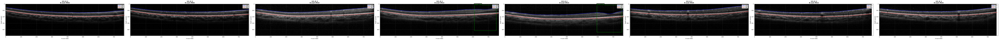


Volume: 121_R_2
  B-scan #002: 0 detections (score >= 0.5)
  B-scan #004: 0 detections (score >= 0.5)
  B-scan #010: 0 detections (score >= 0.5)
  B-scan #013: 1 detections (score >= 0.5)
  B-scan #015: 1 detections (score >= 0.5)
  B-scan #020: 0 detections (score >= 0.5)
  B-scan #022: 0 detections (score >= 0.5)
  B-scan #025: 0 detections (score >= 0.5)


In [10]:
# Example 3: Plot from a different volume
if len(sorted_volumes) > 1:
    second_volume = sorted_volumes[13][0]
    print(f"\nPlotting 2 random B-scans from volume: {second_volume}")
    plot_bscan_with_annotations_and_boxes(second_volume, bscan_indices=(2, 4, 10, 13, 15, 20, 22, 25), score_threshold=0.5)


Plotting B-scans from fovea region of volume: 97_L_6
Selected B-scan indices: [np.int32(14), np.int32(15), np.int32(16)]


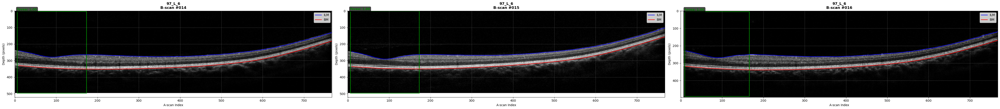


Volume: 97_L_6
  B-scan #014: 1 detections (score >= 0.5)
  B-scan #015: 1 detections (score >= 0.5)
  B-scan #016: 1 detections (score >= 0.5)


In [11]:
# Example 2: Plot specific B-scans (including fovea region - typically B-scans 13-17)
if len(sorted_volumes) > 0:
    first_volume = sorted_volumes[0][0]
    available_bscans = sorted(matching_volumes[first_volume])
    
    # Try to get some B-scans around the middle (fovea region)
    mid_point = len(available_bscans) // 2
    selected_indices = available_bscans[max(0, mid_point-1):mid_point+2]
    
    print(f"\nPlotting B-scans from fovea region of volume: {first_volume}")
    print(f"Selected B-scan indices: {selected_indices}")
    plot_bscan_with_annotations_and_boxes(first_volume, bscan_indices=selected_indices, score_threshold=0.5)

## Thickness Map with Bounding Box Projection

Compute retinal thickness (ILM to BM distance) for each B-scan and create a 2D thickness map. Then project the bounding box locations onto this map.

In [12]:
def compute_thickness(ilm, bm):
    """
    Compute retinal thickness as the vertical distance between ILM and BM.
    
    Parameters:
    -----------
    ilm : np.ndarray
        ILM coordinates (1D array of y-positions)
    bm : np.ndarray
        BM coordinates (1D array of y-positions)
    
    Returns:
    --------
    thickness : np.ndarray
        Thickness values (BM - ILM), NaN where either boundary is NaN
    """
    # Thickness is the vertical distance between boundaries
    thickness = bm - ilm
    return thickness


def create_volume_thickness_map(volume_id, score_threshold=0.5):
    """
    Create a 2D thickness map for an entire volume and extract bounding box information.
    
    Parameters:
    -----------
    volume_id : str
        Volume identifier
    score_threshold : float
        Minimum confidence score for bounding boxes to include
    
    Returns:
    --------
    thickness_map : np.ndarray
        2D array (num_bscans, width) of thickness values
    bb_info : list
        List of dicts containing bounding box information for each B-scan
    bscan_indices : list
        B-scan indices corresponding to rows in thickness_map
    """
    if volume_id not in matching_volumes:
        print(f"Volume '{volume_id}' not found in matching volumes.")
        return None, None, None
    
    available_bscans = sorted(matching_volumes[volume_id])
    
    # Initialize storage
    thickness_list = []
    bb_info = []
    
    for bscan_idx in available_bscans:
        key = f"{volume_id}_{bscan_idx:03d}"
        
        # Get HDF5 data
        hdf5_data = hdf5_mapping[key]
        global_idx = hdf5_data['global_idx']
        
        # Get layer annotations
        ilm = ilm_coords[global_idx]
        bm = bm_coords[global_idx]
        
        # Compute thickness
        thickness = compute_thickness(ilm, bm)
        thickness_list.append(thickness)
        
        # Get detection data
        det_data = detection_mapping[key]
        pred_boxes = det_data['pred_boxes']
        pred_labels = det_data['pred_labels']
        pred_scores = det_data['pred_scores']
        
        # Extract bounding box info (only high confidence boxes)
        bscan_boxes = []
        for box, label, score in zip(pred_boxes, pred_labels, pred_scores):
            if score >= score_threshold:
                x1, y1, x2, y2 = box
                center_x = (x1 + x2) / 2
                width = x2 - x1
                bscan_boxes.append({
                    'x1': x1,
                    'x2': x2,
                    'center_x': center_x,
                    'width': width,
                    'label': label,
                    'score': score
                })
        
        bb_info.append({
            'bscan_idx': bscan_idx,
            'boxes': bscan_boxes
        })
    
    # Stack into 2D array
    thickness_map = np.array(thickness_list)
    
    return thickness_map, bb_info, available_bscans


print("Thickness computation functions created!")

Thickness computation functions created!


In [13]:
def plot_thickness_map_with_bboxes(volume_id, score_threshold=0.7, figsize=(16, 10)):
    """
    Plot thickness map with bounding box projections overlaid.
    
    Parameters:
    -----------
    volume_id : str
        Volume identifier
    score_threshold : float
        Minimum confidence score for bounding boxes
    figsize : tuple
        Figure size
    """
    # Create thickness map
    thickness_map, bb_info, bscan_indices = create_volume_thickness_map(volume_id, score_threshold)
    
    if thickness_map is None:
        return
    
    # Create figure
    fig, ax = plt.subplots(figsize=figsize)
    
    # Plot thickness map as heatmap
    # Use fixed scale from 40 to 100 pixels
    vmin = 40
    vmax = 120
    
    im = ax.imshow(thickness_map, aspect='auto', cmap='hot', 
                   interpolation='bilinear', vmin=vmin, vmax=vmax,
                   extent=[0, thickness_map.shape[1], len(bscan_indices)-0.5, -0.5])
    
    # Add colorbar
    cbar = plt.colorbar(im, ax=ax, label='Retinal Thickness (pixels)')
    
    # Overlay bounding boxes
    label_colors = {1: 'lime', 2: 'cyan'}  # fovea: green, lesion: cyan
    label_names = {1: 'fovea', 2: 'lesion'}
    
    for idx, bb_data in enumerate(bb_info):
        bscan_idx = bb_data['bscan_idx']
        y_pos = idx  # Row position in the thickness map
        
        for box in bb_data['boxes']:
            x1 = box['x1']
            x2 = box['x2']
            center_x = box['center_x']
            label = box['label']
            
            color = label_colors.get(label, 'white')
            
            # Draw horizontal line for bbox width
            ax.plot([x1, x2], [y_pos, y_pos], color=color, 
                   linewidth=2, alpha=0.8, linestyle='-')
            
            # Draw X marker at center
            ax.plot(center_x, y_pos, 'x', color=color, 
                   markersize=10, markeredgewidth=2)
    
    # Set labels and title
    ax.set_xlabel('A-scan Index (Width)', fontsize=12)
    ax.set_ylabel('B-scan Index', fontsize=12)
    ax.set_title(f'Thickness Map with Bounding Box Projections\nVolume: {volume_id}', 
                fontsize=14, fontweight='bold')
    
    # Set y-tick labels to actual B-scan indices
    y_ticks = np.arange(0, len(bscan_indices), max(1, len(bscan_indices)//10))
    ax.set_yticks(y_ticks)
    ax.set_yticklabels([bscan_indices[i] for i in y_ticks])
    
    ax.grid(True, alpha=0.2, color='white', linestyle='--')
    
    # Add legend
    from matplotlib.patches import Patch
    legend_elements = [
        Patch(facecolor='lime', edgecolor='lime', label='Fovea BB'),
        Patch(facecolor='cyan', edgecolor='cyan', label='Lesion BB')
    ]
    ax.legend(handles=legend_elements, loc='upper right', framealpha=0.9)
    
    plt.tight_layout()
    plt.show()
    
    # Print statistics
    print(f"\n{'='*70}")
    print(f"THICKNESS MAP STATISTICS - Volume: {volume_id}")
    print(f"{'='*70}")
    print(f"Number of B-scans: {len(bscan_indices)}")
    print(f"Thickness map shape: {thickness_map.shape} (B-scans × Width)")
    print(f"Mean thickness: {np.nanmean(thickness_map):.2f} pixels")
    print(f"Std thickness: {np.nanstd(thickness_map):.2f} pixels")
    print(f"Min thickness: {np.nanmin(thickness_map):.2f} pixels")
    print(f"Max thickness: {np.nanmax(thickness_map):.2f} pixels")
    
    # Count bounding boxes
    total_fovea = sum(sum(1 for box in bb['boxes'] if box['label'] == 1) for bb in bb_info)
    total_lesion = sum(sum(1 for box in bb['boxes'] if box['label'] == 2) for bb in bb_info)
    
    print(f"\nBounding Box Summary (score >= {score_threshold}):")
    print(f"  Total fovea detections: {total_fovea}")
    print(f"  Total lesion detections: {total_lesion}")
    print(f"  B-scans with fovea: {sum(1 for bb in bb_info if any(box['label']==1 for box in bb['boxes']))}")
    print(f"  B-scans with lesion: {sum(1 for bb in bb_info if any(box['label']==2 for box in bb['boxes']))}")

print("Thickness map visualization function created!")

Thickness map visualization function created!


### Example: Thickness Map Visualization

Let's create thickness maps for some volumes with bounding box projections:

In [ ]:
# Example 1: Thickness map for first volume
if len(sorted_volumes) > 0:
    volume_to_plot = sorted_volumes[0][0]
    print(f"Creating thickness map for volume: {volume_to_plot}\n")
    plot_thickness_map_with_bboxes(volume_to_plot, score_threshold=0.7)

In [ ]:
# Define the volume to analyze
volume_to_analyze = '142_L_3'

# Plot the full thickness map
print(f"Creating thickness map for volume: {volume_to_analyze}\n")
plot_thickness_map_with_bboxes(volume_to_analyze, score_threshold=0.7)


Volume index 10: 241_L_1 (31 B-scans)


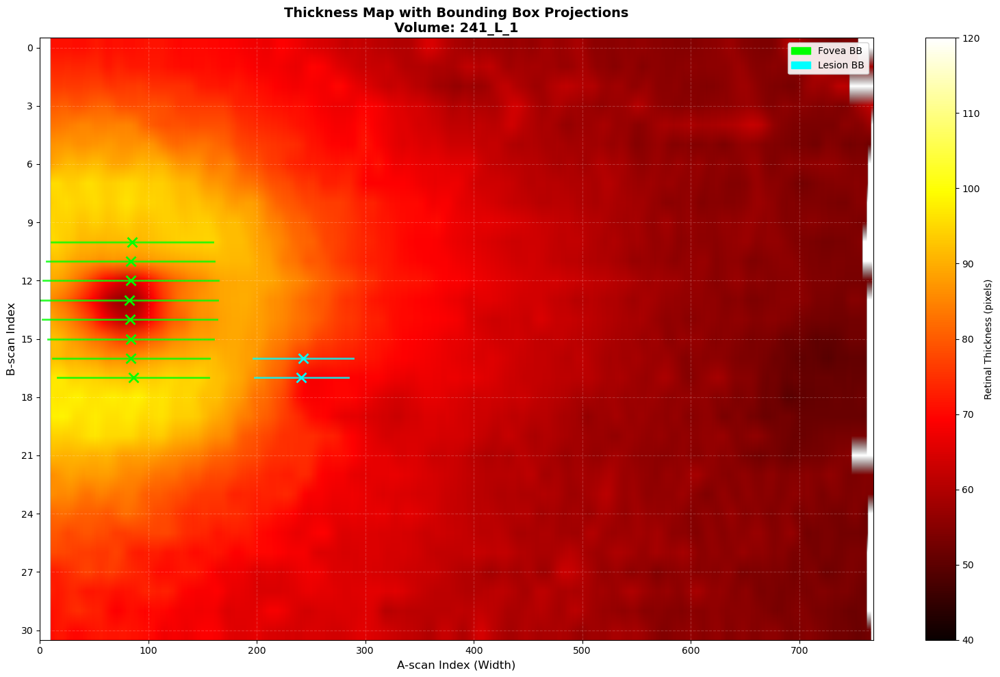


THICKNESS MAP STATISTICS - Volume: 241_L_1
Number of B-scans: 31
Thickness map shape: (31, 768) (B-scans × Width)
Mean thickness: 66.71 pixels
Std thickness: 11.93 pixels
Min thickness: 49.37 pixels
Max thickness: 98.22 pixels

Bounding Box Summary (score >= 0.7):
  Total fovea detections: 8
  Total lesion detections: 2
  B-scans with fovea: 8
  B-scans with lesion: 2

Volume index 11: 257_R_1_1 (31 B-scans)


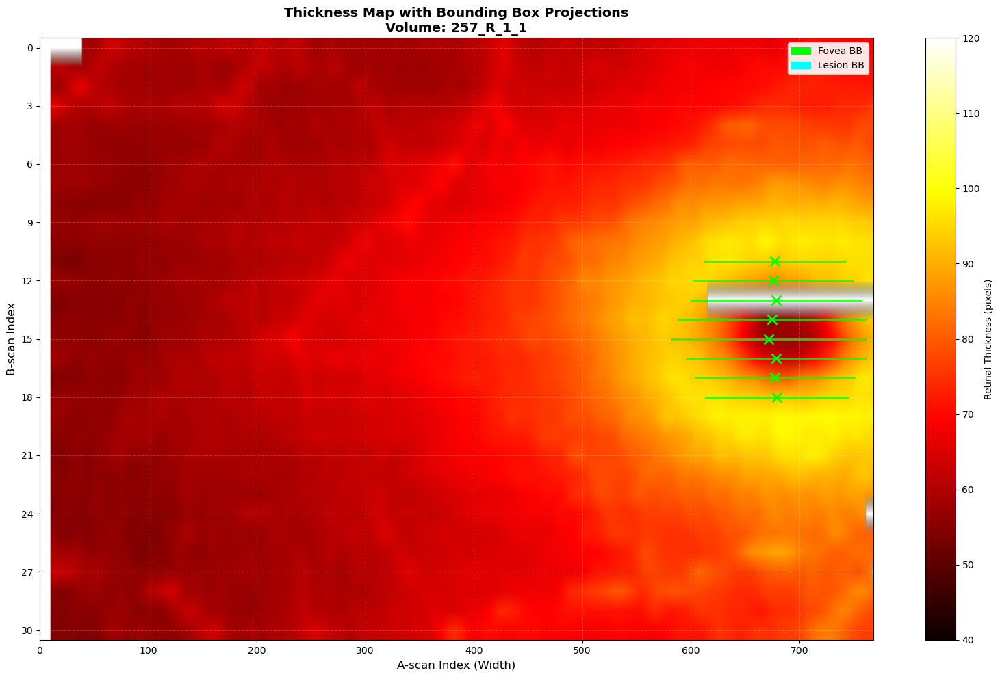


THICKNESS MAP STATISTICS - Volume: 257_R_1_1
Number of B-scans: 31
Thickness map shape: (31, 768) (B-scans × Width)
Mean thickness: 69.19 pixels
Std thickness: 11.64 pixels
Min thickness: 53.33 pixels
Max thickness: 99.34 pixels

Bounding Box Summary (score >= 0.7):
  Total fovea detections: 8
  Total lesion detections: 0
  B-scans with fovea: 8
  B-scans with lesion: 0

Volume index 12: 124_L_5 (31 B-scans)


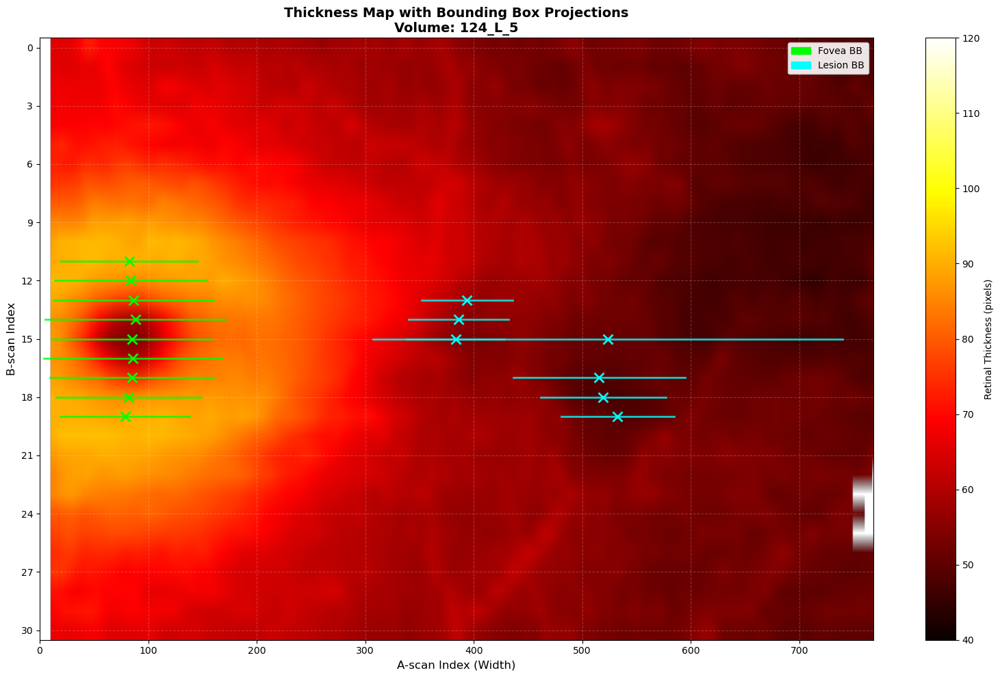


THICKNESS MAP STATISTICS - Volume: 124_L_5
Number of B-scans: 31
Thickness map shape: (31, 768) (B-scans × Width)
Mean thickness: 61.93 pixels
Std thickness: 11.99 pixels
Min thickness: 44.87 pixels
Max thickness: 92.07 pixels

Bounding Box Summary (score >= 0.7):
  Total fovea detections: 9
  Total lesion detections: 7
  B-scans with fovea: 9
  B-scans with lesion: 6

Volume index 13: 121_R_2 (31 B-scans)


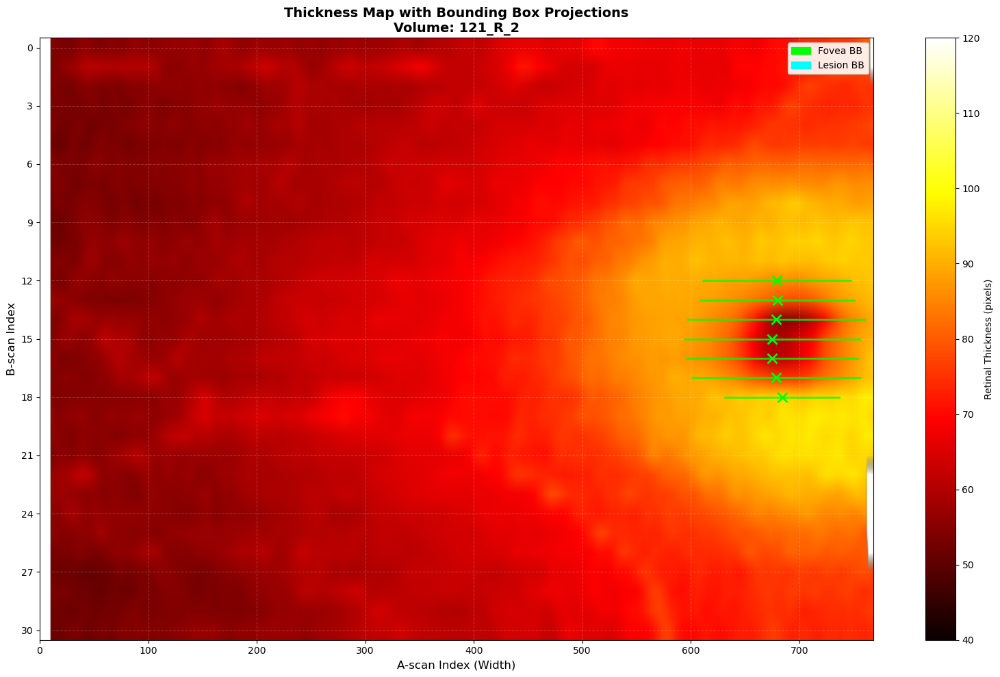


THICKNESS MAP STATISTICS - Volume: 121_R_2
Number of B-scans: 31
Thickness map shape: (31, 768) (B-scans × Width)
Mean thickness: 68.00 pixels
Std thickness: 11.47 pixels
Min thickness: 50.66 pixels
Max thickness: 97.52 pixels

Bounding Box Summary (score >= 0.7):
  Total fovea detections: 7
  Total lesion detections: 0
  B-scans with fovea: 7
  B-scans with lesion: 0

Volume index 14: 248_R_1_1 (31 B-scans)


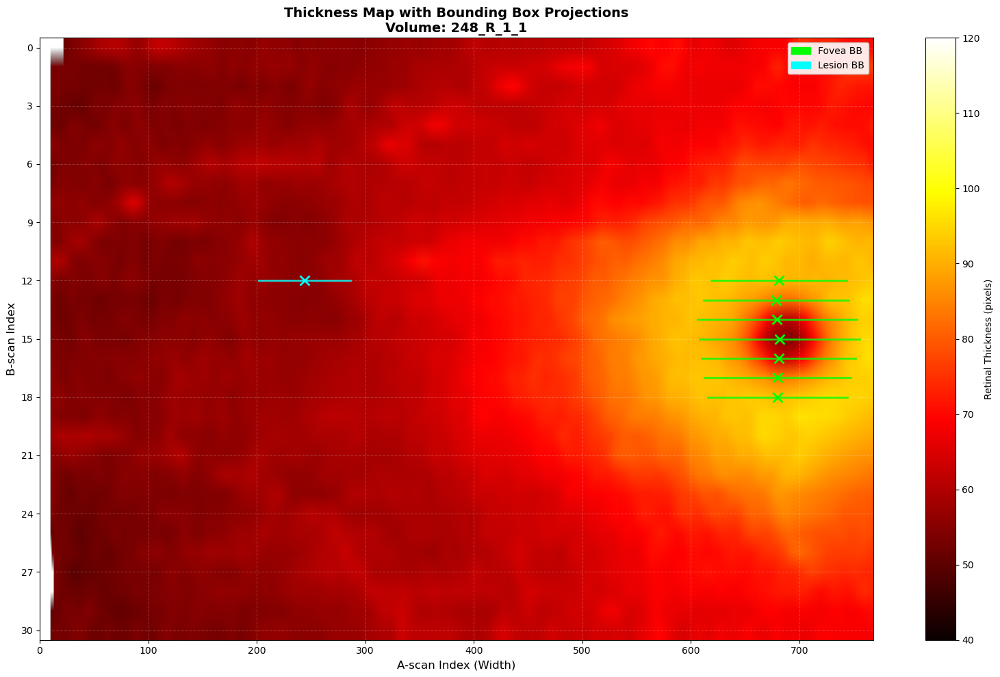


THICKNESS MAP STATISTICS - Volume: 248_R_1_1
Number of B-scans: 31
Thickness map shape: (31, 768) (B-scans × Width)
Mean thickness: 65.98 pixels
Std thickness: 11.55 pixels
Min thickness: 49.81 pixels
Max thickness: 96.18 pixels

Bounding Box Summary (score >= 0.7):
  Total fovea detections: 7
  Total lesion detections: 1
  B-scans with fovea: 7
  B-scans with lesion: 1

Volume index 15: 250_L_1 (31 B-scans)


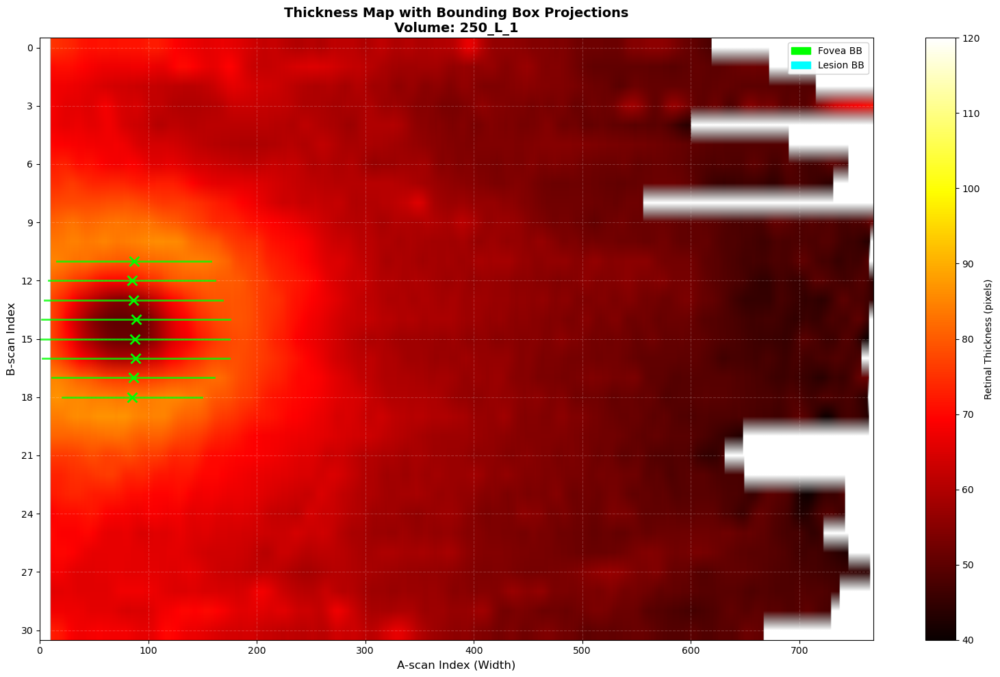


THICKNESS MAP STATISTICS - Volume: 250_L_1
Number of B-scans: 31
Thickness map shape: (31, 768) (B-scans × Width)
Mean thickness: 59.47 pixels
Std thickness: 9.60 pixels
Min thickness: 40.10 pixels
Max thickness: 86.81 pixels

Bounding Box Summary (score >= 0.7):
  Total fovea detections: 8
  Total lesion detections: 0
  B-scans with fovea: 8
  B-scans with lesion: 0

Volume index 16: 34_R_5 (31 B-scans)


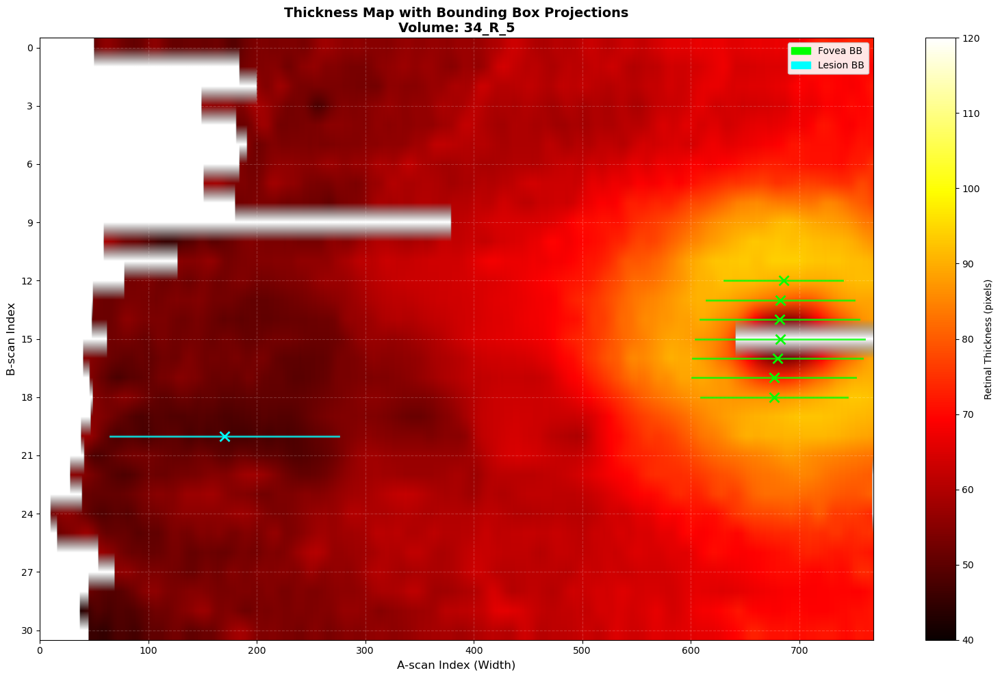


THICKNESS MAP STATISTICS - Volume: 34_R_5
Number of B-scans: 31
Thickness map shape: (31, 768) (B-scans × Width)
Mean thickness: 63.98 pixels
Std thickness: 11.38 pixels
Min thickness: 43.10 pixels
Max thickness: 94.02 pixels

Bounding Box Summary (score >= 0.7):
  Total fovea detections: 7
  Total lesion detections: 1
  B-scans with fovea: 7
  B-scans with lesion: 1

Volume index 17: 246_L_1 (31 B-scans)


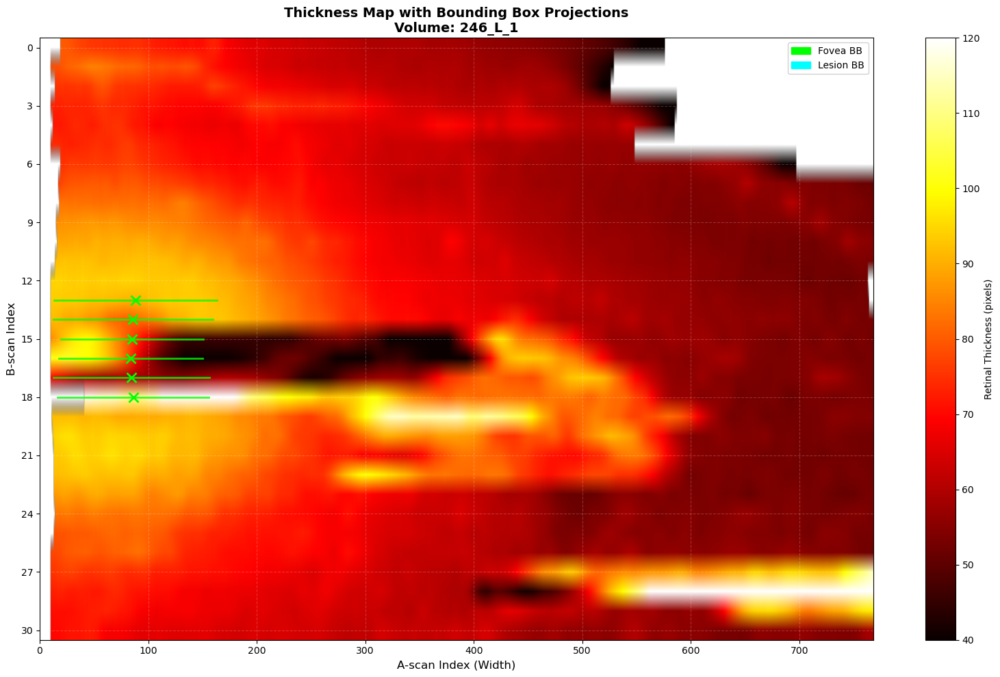


THICKNESS MAP STATISTICS - Volume: 246_L_1
Number of B-scans: 31
Thickness map shape: (31, 768) (B-scans × Width)
Mean thickness: 69.19 pixels
Std thickness: 18.05 pixels
Min thickness: 30.98 pixels
Max thickness: 226.77 pixels

Bounding Box Summary (score >= 0.7):
  Total fovea detections: 6
  Total lesion detections: 0
  B-scans with fovea: 6
  B-scans with lesion: 0

Volume index 18: 242_L_1 (31 B-scans)


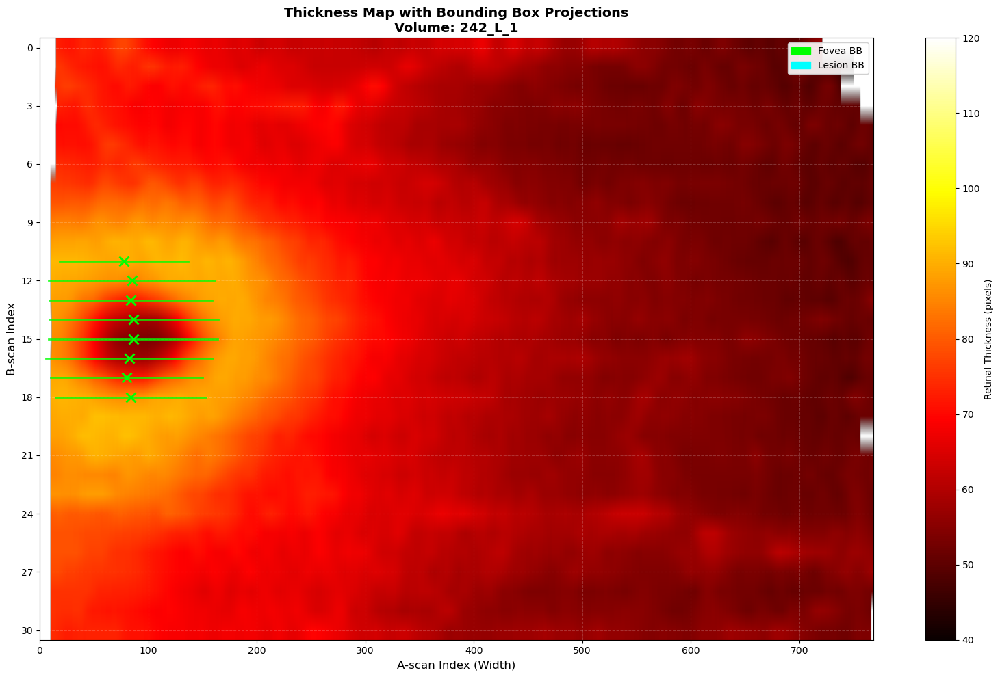


THICKNESS MAP STATISTICS - Volume: 242_L_1
Number of B-scans: 31
Thickness map shape: (31, 768) (B-scans × Width)
Mean thickness: 63.87 pixels
Std thickness: 11.12 pixels
Min thickness: 39.10 pixels
Max thickness: 92.17 pixels

Bounding Box Summary (score >= 0.7):
  Total fovea detections: 8
  Total lesion detections: 0
  B-scans with fovea: 8
  B-scans with lesion: 0

Volume index 19: 249_R_1 (31 B-scans)


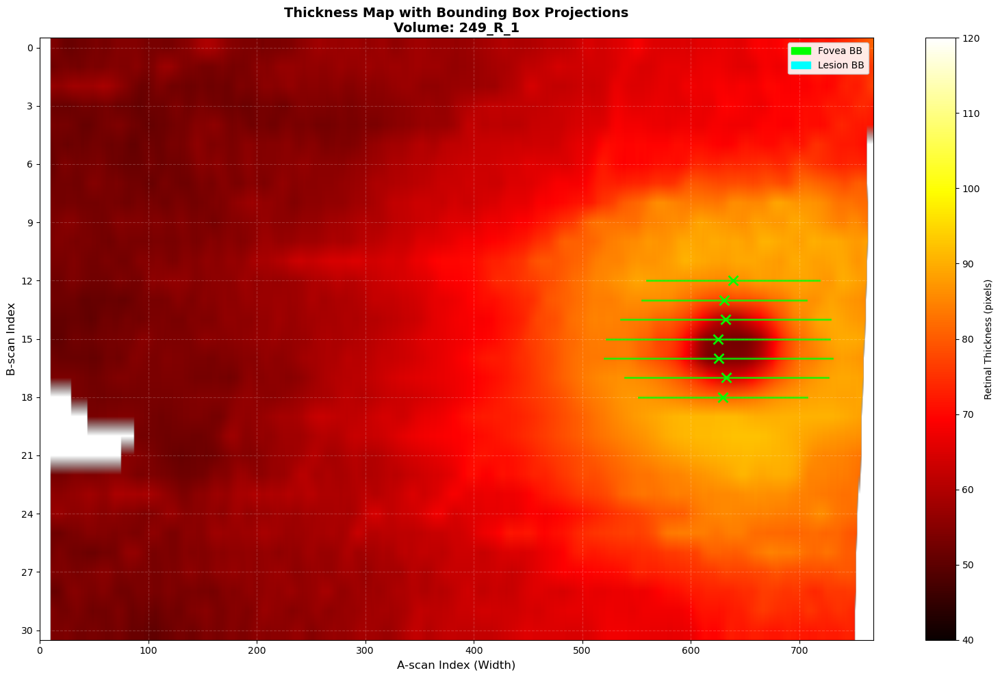


THICKNESS MAP STATISTICS - Volume: 249_R_1
Number of B-scans: 31
Thickness map shape: (31, 768) (B-scans × Width)
Mean thickness: 66.20 pixels
Std thickness: 11.76 pixels
Min thickness: 50.38 pixels
Max thickness: 92.46 pixels

Bounding Box Summary (score >= 0.7):
  Total fovea detections: 7
  Total lesion detections: 0
  B-scans with fovea: 7
  B-scans with lesion: 0

Volume index 20: 240_R_1 (31 B-scans)


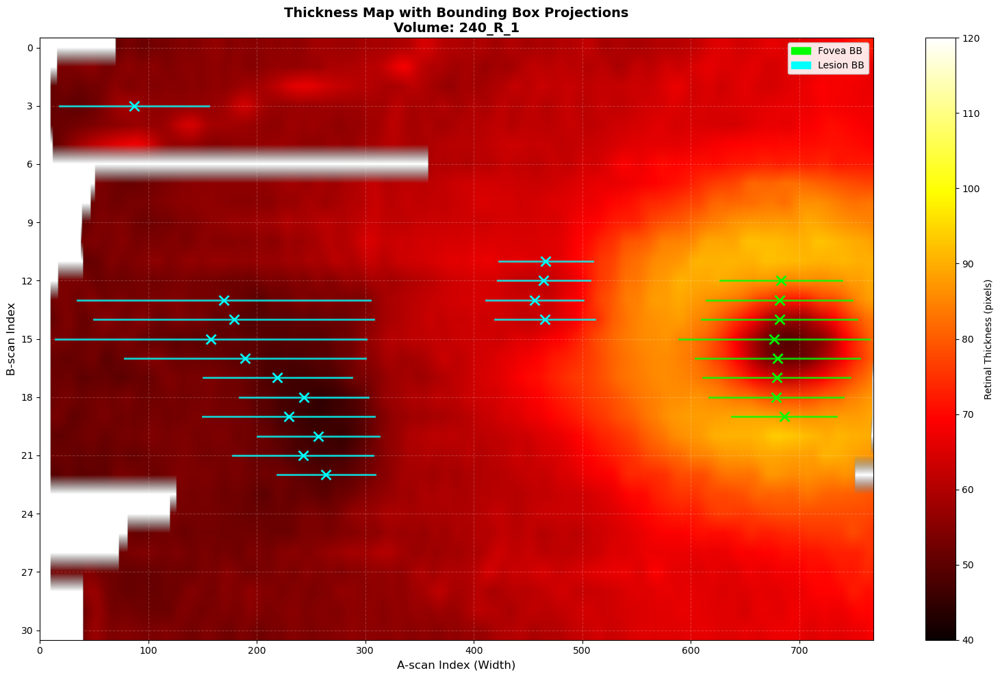


THICKNESS MAP STATISTICS - Volume: 240_R_1
Number of B-scans: 31
Thickness map shape: (31, 768) (B-scans × Width)
Mean thickness: 63.54 pixels
Std thickness: 10.95 pixels
Min thickness: 44.60 pixels
Max thickness: 93.70 pixels

Bounding Box Summary (score >= 0.7):
  Total fovea detections: 8
  Total lesion detections: 15
  B-scans with fovea: 8
  B-scans with lesion: 13

Volume index 21: 257_L_1 (31 B-scans)


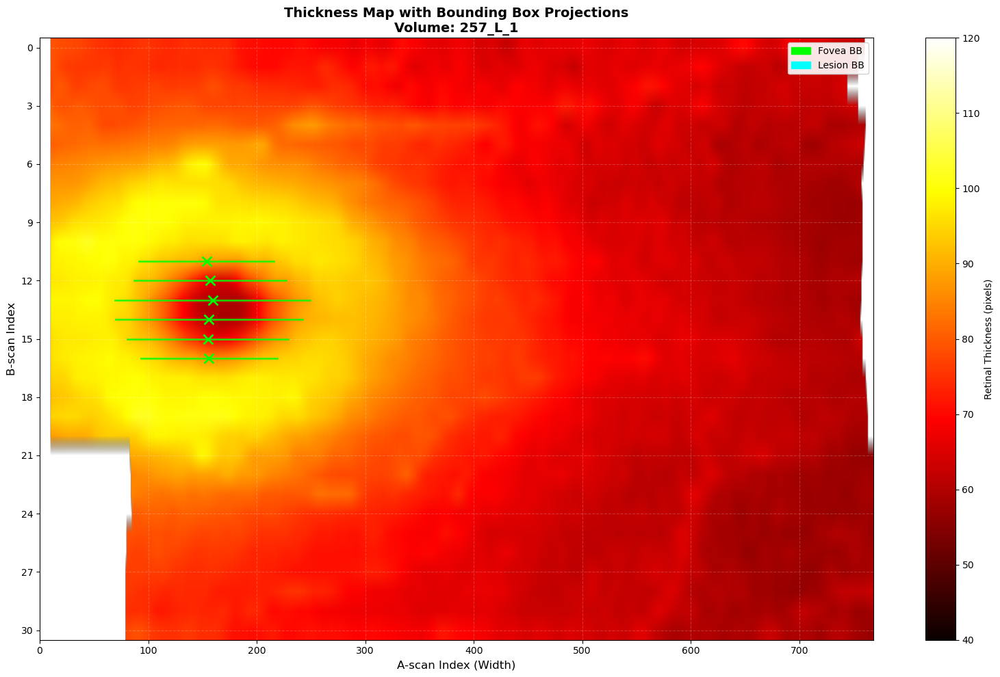


THICKNESS MAP STATISTICS - Volume: 257_L_1
Number of B-scans: 31
Thickness map shape: (31, 768) (B-scans × Width)
Mean thickness: 73.44 pixels
Std thickness: 12.21 pixels
Min thickness: 56.16 pixels
Max thickness: 102.36 pixels

Bounding Box Summary (score >= 0.7):
  Total fovea detections: 6
  Total lesion detections: 0
  B-scans with fovea: 6
  B-scans with lesion: 0

Volume index 22: 237_R_2_1 (31 B-scans)


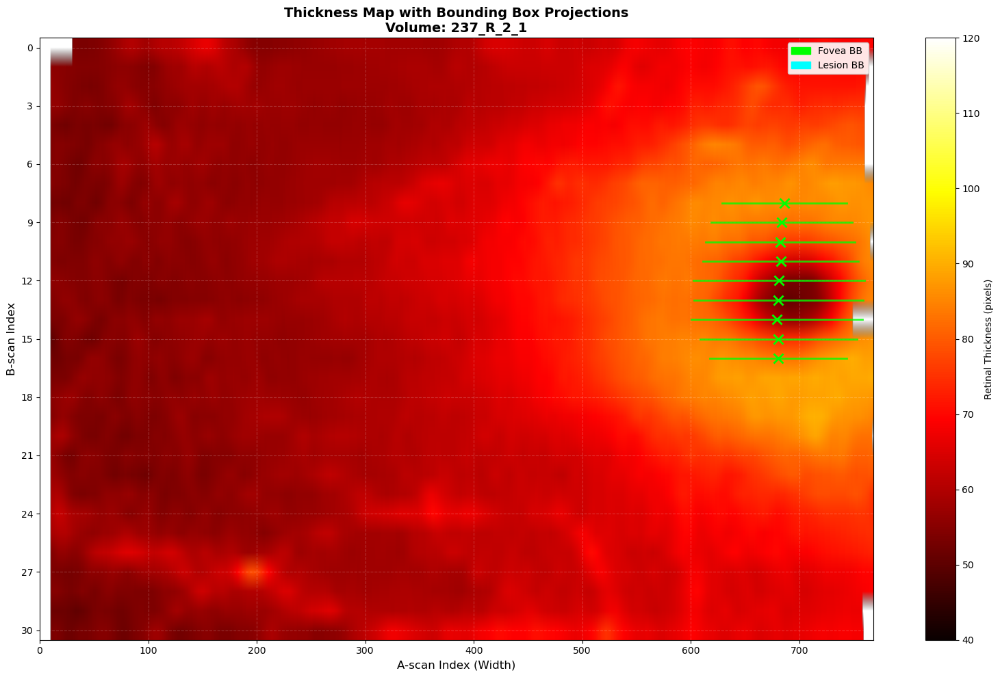


THICKNESS MAP STATISTICS - Volume: 237_R_2_1
Number of B-scans: 31
Thickness map shape: (31, 768) (B-scans × Width)
Mean thickness: 65.10 pixels
Std thickness: 9.47 pixels
Min thickness: 49.60 pixels
Max thickness: 90.32 pixels

Bounding Box Summary (score >= 0.7):
  Total fovea detections: 9
  Total lesion detections: 0
  B-scans with fovea: 9
  B-scans with lesion: 0

Volume index 23: 256_R_1_1 (31 B-scans)


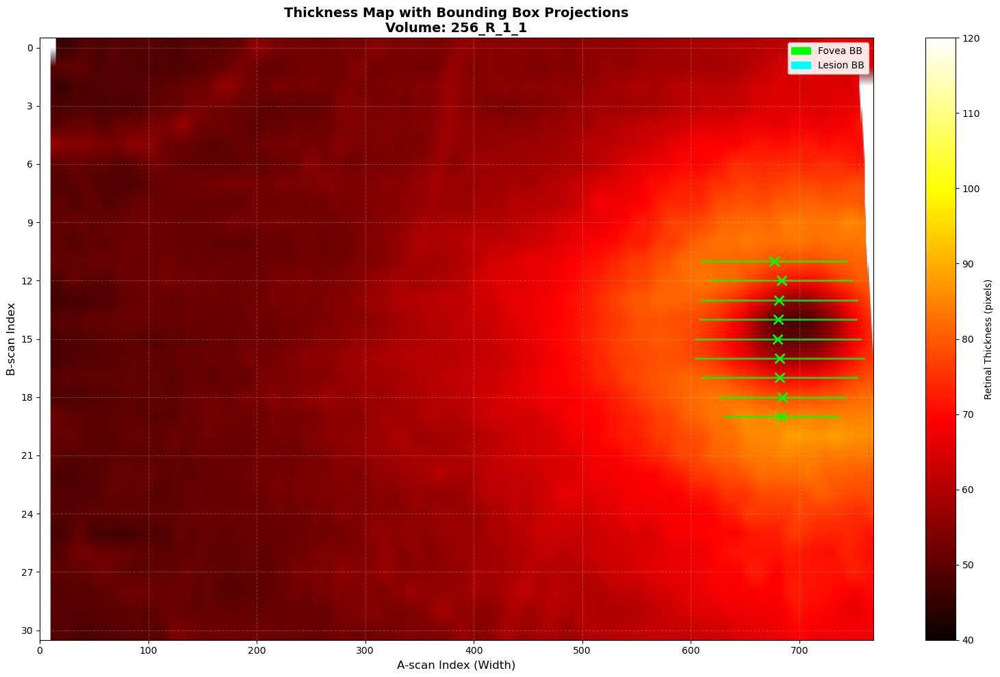


THICKNESS MAP STATISTICS - Volume: 256_R_1_1
Number of B-scans: 31
Thickness map shape: (31, 768) (B-scans × Width)
Mean thickness: 60.47 pixels
Std thickness: 10.03 pixels
Min thickness: 45.48 pixels
Max thickness: 88.39 pixels

Bounding Box Summary (score >= 0.7):
  Total fovea detections: 9
  Total lesion detections: 0
  B-scans with fovea: 9
  B-scans with lesion: 0

Volume index 24: 240_L_1 (31 B-scans)


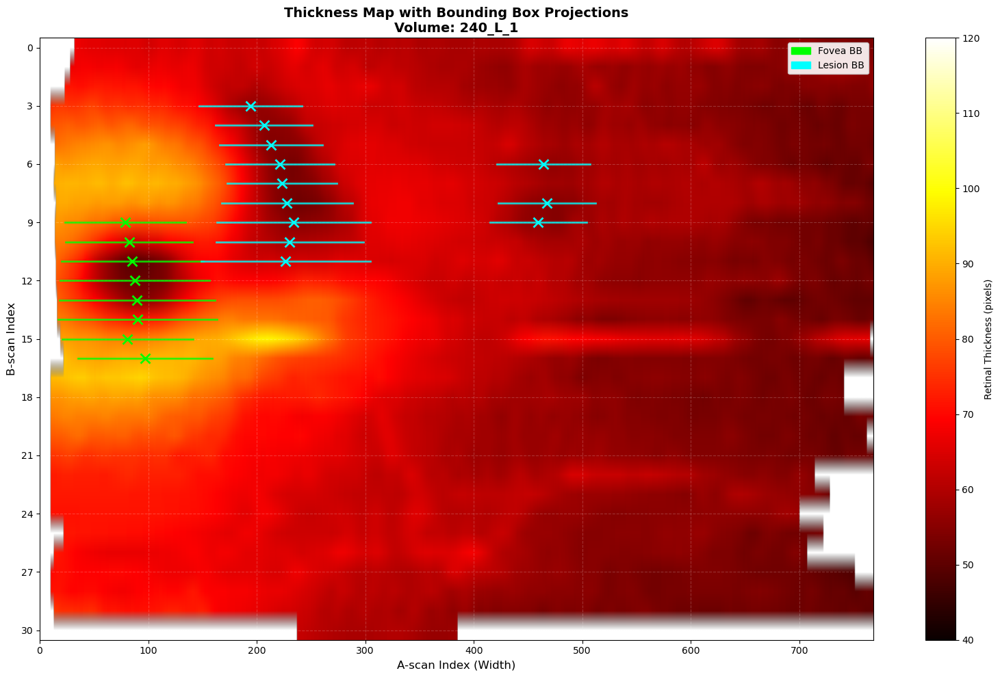


THICKNESS MAP STATISTICS - Volume: 240_L_1
Number of B-scans: 31
Thickness map shape: (31, 768) (B-scans × Width)
Mean thickness: 63.36 pixels
Std thickness: 9.65 pixels
Min thickness: 47.71 pixels
Max thickness: 98.45 pixels

Bounding Box Summary (score >= 0.7):
  Total fovea detections: 8
  Total lesion detections: 12
  B-scans with fovea: 8
  B-scans with lesion: 9

Volume index 25: 243_L_1 (31 B-scans)


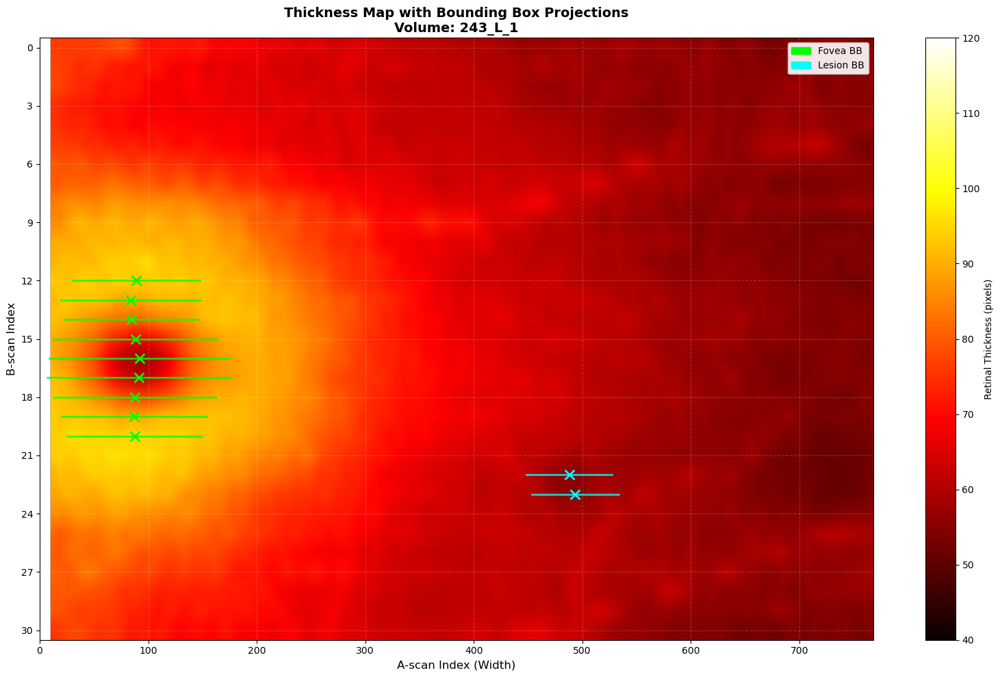


THICKNESS MAP STATISTICS - Volume: 243_L_1
Number of B-scans: 31
Thickness map shape: (31, 768) (B-scans × Width)
Mean thickness: 67.21 pixels
Std thickness: 11.55 pixels
Min thickness: 51.19 pixels
Max thickness: 96.32 pixels

Bounding Box Summary (score >= 0.7):
  Total fovea detections: 9
  Total lesion detections: 2
  B-scans with fovea: 9
  B-scans with lesion: 2

Volume index 26: 62_L_6 (31 B-scans)


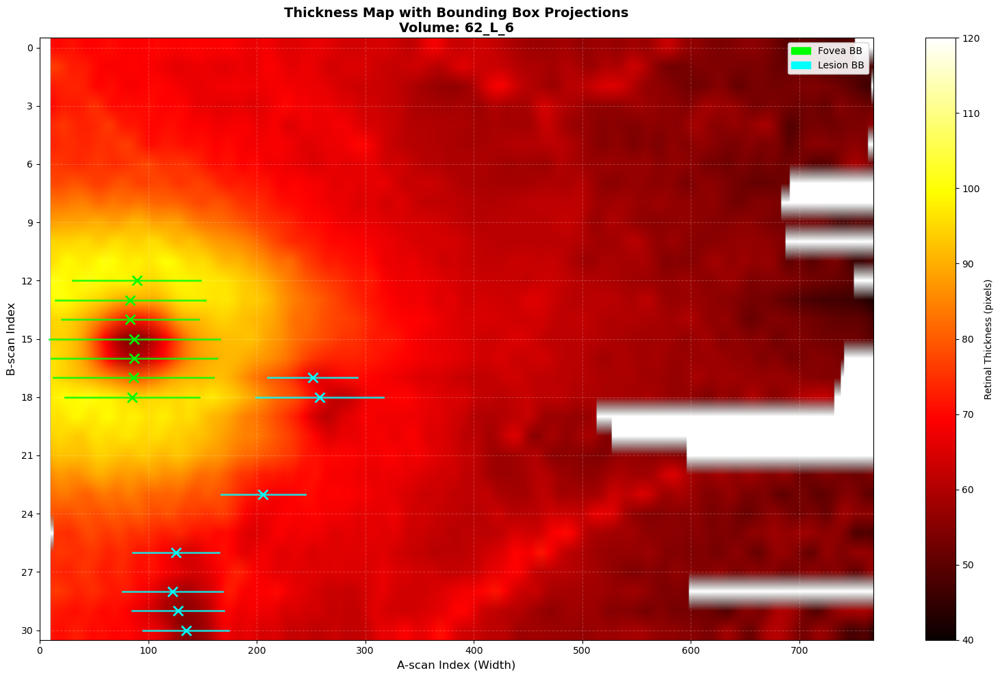


THICKNESS MAP STATISTICS - Volume: 62_L_6
Number of B-scans: 31
Thickness map shape: (31, 768) (B-scans × Width)
Mean thickness: 66.18 pixels
Std thickness: 11.84 pixels
Min thickness: 42.46 pixels
Max thickness: 101.10 pixels

Bounding Box Summary (score >= 0.7):
  Total fovea detections: 7
  Total lesion detections: 7
  B-scans with fovea: 7
  B-scans with lesion: 7

Volume index 27: 248_L_1_1 (31 B-scans)


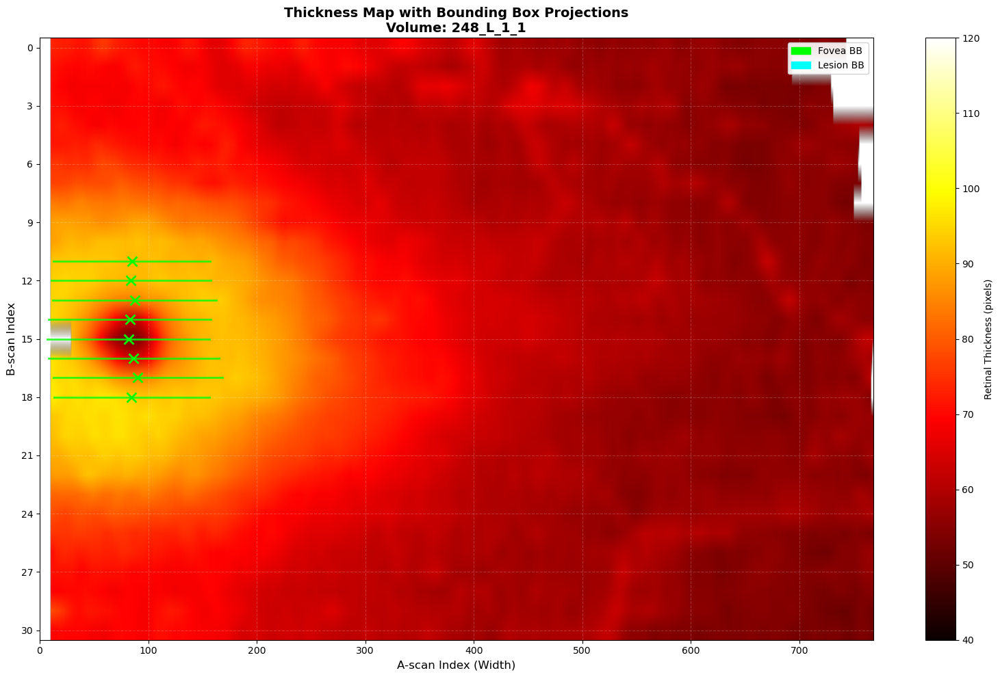


THICKNESS MAP STATISTICS - Volume: 248_L_1_1
Number of B-scans: 31
Thickness map shape: (31, 768) (B-scans × Width)
Mean thickness: 66.03 pixels
Std thickness: 11.12 pixels
Min thickness: 51.38 pixels
Max thickness: 97.39 pixels

Bounding Box Summary (score >= 0.7):
  Total fovea detections: 8
  Total lesion detections: 0
  B-scans with fovea: 8
  B-scans with lesion: 0

Volume index 28: 22_R_5 (31 B-scans)


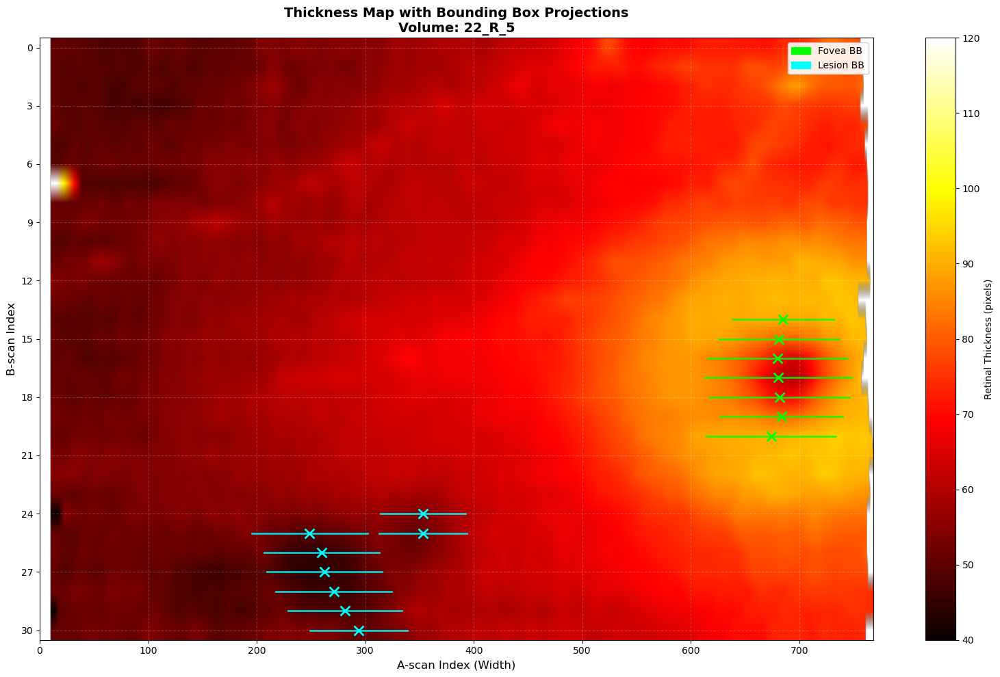


THICKNESS MAP STATISTICS - Volume: 22_R_5
Number of B-scans: 31
Thickness map shape: (31, 768) (B-scans × Width)
Mean thickness: 65.00 pixels
Std thickness: 12.06 pixels
Min thickness: 21.50 pixels
Max thickness: 134.51 pixels

Bounding Box Summary (score >= 0.7):
  Total fovea detections: 7
  Total lesion detections: 8
  B-scans with fovea: 7
  B-scans with lesion: 7

Volume index 29: 244_R_1 (31 B-scans)


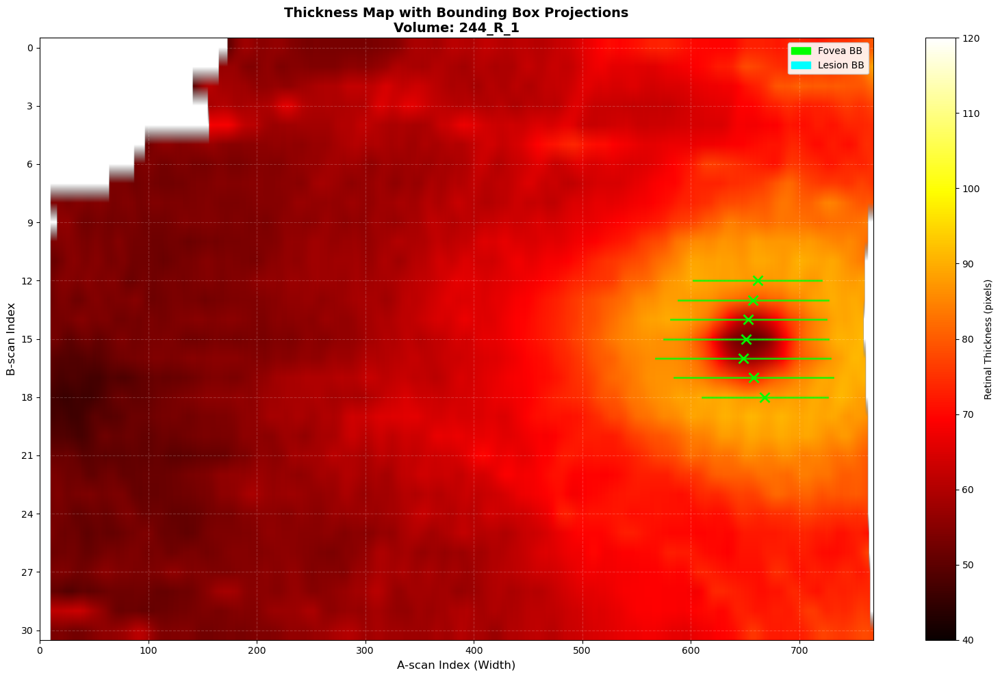


THICKNESS MAP STATISTICS - Volume: 244_R_1
Number of B-scans: 31
Thickness map shape: (31, 768) (B-scans × Width)
Mean thickness: 64.85 pixels
Std thickness: 10.75 pixels
Min thickness: 45.81 pixels
Max thickness: 91.48 pixels

Bounding Box Summary (score >= 0.7):
  Total fovea detections: 7
  Total lesion detections: 0
  B-scans with fovea: 7
  B-scans with lesion: 0


In [ ]:
# Plot thickness maps for volumes by index range
start_volume_idx = 31  # Start index (inclusive)
end_volume_idx = 60    # End index (exclusive)

volume_indices = range(start_volume_idx, end_volume_idx)

for vol_idx in volume_indices:
    if vol_idx < len(sorted_volumes):
        volume_id = sorted_volumes[vol_idx][0]
        num_bscans = len(matching_volumes[volume_id])
        
        print(f"\nVolume index {vol_idx}: {volume_id} ({num_bscans} B-scans)")
        print("="*70)
        plot_thickness_map_with_bboxes(volume_id, score_threshold=0.7)
    else:
        print(f"Volume index {vol_idx} out of range (max: {len(sorted_volumes)-1})")

In [ ]:

#print(f"Creating thickness map for volume: {volume_to_plot}\n")
plot_thickness_map_with_bboxes('185_R_3', score_threshold=0.7)

In [ ]:

plot_bscan_with_annotations_and_boxes('185_R_3', bscan_indices=[3, 22, 23, 24, 25, 26], score_threshold=0.7)